# November 24th, 2021 (corr distrs)

**Motivation**: Visualizing distribution of correlation values, left/right hemisphere discrepacny in BOLD, some discussion on GSR <br>

In [1]:
# HIDE CODE


import os
import sys
import nibabel as nib
import networkx as nx
from time import time
from pprint import pprint
from copy import deepcopy as dc
from os.path import join as pjoin
from myterial import orange, blue_grey
from IPython.display import display, IFrame, HTML
from matplotlib.colors import rgb2hex, to_rgb
import matplotlib.pyplot as plt
import seaborn as sns

# set style & no interpolalation
import matplotlib
matplotlib.rcParams['image.interpolation'] = 'none'
sns.set_style('whitegrid')
%matplotlib inline

# tmp & extras dir
git_dir = pjoin(os.environ['HOME'], 'Dropbox/git')
tmp_dir = pjoin(git_dir, 'jb-Ca-fMRI/tmp')
extras_dir = pjoin(git_dir, 'jb-Ca-fMRI/_extras')
lfr_dir = pjoin(os.environ['HOME'], 'Documents/workspaces/lfr/binary_overlapping')


# GitHub
sys.path.insert(0, pjoin(git_dir, '_Ca-fMRI'))
from register.atlas import make_tree_graph
from register.parcellation import Parcellation
from analysis.hierarchical import Hierarchical
from analysis.fourier import *
from analysis.bootstrap import *
from analysis.svinet import *
from analysis.group import *
from analysis.lfr import *
from utils.render import *
from utils.plotting import *
from model.mouse import Mice
from model.configuration import Config

# warnings
import warnings
warnings.filterwarnings('ignore', category=DeprecationWarning)

In [2]:
# HIDE CODE


def show_corrs(adj_dict, l_ids, r_ids, figsize=(13.5, 4.4)):
    fig, axes = create_figure(2, 6, figsize)

    for i, (lbl, a) in enumerate(adj_dict.items()):
        xl = a[l_ids][:, l_ids]
        xr = a[r_ids][:, r_ids]
        vmin = np.min(a[a.nonzero()])
        vmax = np.max(a[a.nonzero()])

        j = 2 * i
        im = axes[0, j].imshow(xl, vmin=vmin, vmax=vmax, cmap='Spectral_r')
        plt.colorbar(im, ax=axes[0, j], shrink=0.75)
        axes[0, j].set_title(f"{lbl}\n(left hemis)")

        j = 2 * i + 1
        im = axes[0, j].imshow(xr, vmin=vmin, vmax=vmax, cmap='Spectral_r')
        plt.colorbar(im, ax=axes[0, j], shrink=0.75)
        axes[0, j].set_title(f"{lbl}\n(right hemis)")

        j = 2 * i
        sns.histplot(
            data=xl[xl.nonzero()],
            label='left',
            stat='percent',
            color='C0',
            bins=30,
            alpha=0.7,
            ax=axes[1, j],
        )
        sns.histplot(
            data=xr[xr.nonzero()],
            label='right',
            stat='percent',
            color='C3',
            bins=30,
            alpha=0.7,
            ax=axes[1, j],
        )
        axes[1, j].set_xlabel('correlation')
        axes[1, j].set_title(f"{lbl} hist")
        axes[1, j].legend(fontsize='small')

        j = 2 * i + 1
        sns.ecdfplot(
            data=xl[xl.nonzero()],
            label='left',
            color='C0',
            lw=2,
            ax=axes[1, j],
        )
        sns.ecdfplot(
            data=xr[xr.nonzero()],
            label='right',
            color='C3',
            lw=2,
            ax=axes[1, j],
        )
        axes[1, j].set_xlabel('correlation')
        axes[1, j].set_title(f"{lbl} ecdf")
        axes[1, j].legend(fontsize='small')
        axes[1, j].grid()
    fig.suptitle(key, fontsize=13, y=1.02)
    plt.show()
    
    return fig, axes

In [3]:
mice = Mice((192, 4))
mice.setup_func_data(bold_gsr=False)

In [4]:
# HIDE CODE


adj_ca = []
adj_bold = []
adj_bold_nogsr = []

for key, (sub, ses, run) in tqdm(mice.looper.items()):
    if run == -1:
        continue
    try:
        net_ca = Network(mice, key, 'ca2').load_network()
        net_bold = Network(mice, key, 'bold-lite').load_network()
    except TypeError:
        continue
        
    if net_ca is None or net_bold is None:
        print(key)
        continue
        
    base = Base(mice, key=key, mode='bold-lite')
    a, p = get_adj_mat(base.data, 'pearson')

    adj_ca.append(np.expand_dims(net_ca.adj, 0))
    adj_bold.append(np.expand_dims(net_bold.adj, 0))
    adj_bold_nogsr.append(np.expand_dims(a, 0))

adj_ca = np.concatenate(adj_ca)
adj_bold = np.concatenate(adj_bold)
adj_bold_nogsr = np.concatenate(adj_bold_nogsr)

adj_ca.shape, adj_bold.shape, adj_bold_nogsr.shape

  0%|          | 0/246 [00:00<?, ?it/s]

sub-SLC03_ses-1_run-1

((99, 300, 300), (99, 300, 300), (99, 300, 300))

In [9]:
key = 'sub-SLC02_ses-3_run-5'

In [11]:
net = Network(mice, key, 'ca2').load_network()

## Distribution of correaltion values
The goal here is to take a look at how correaltion values are distributed.  I find that there is a clear shift in distribution of left vs. right intra-hemisphere correlations in BOLD.  I also show that GSR completely shifts the distribution of correaltions toward negative values.  This is a consequence of the "mathematical mandate" in GSR.

### 1) Aggregate fig (combine runs)
First let's use data from all runs to visualize distribution of correlations.  To be clear: here I take adjacency matrices from all runs and lump all the correlation values together.  In the next section I will make the same plot for each run separately to compare.

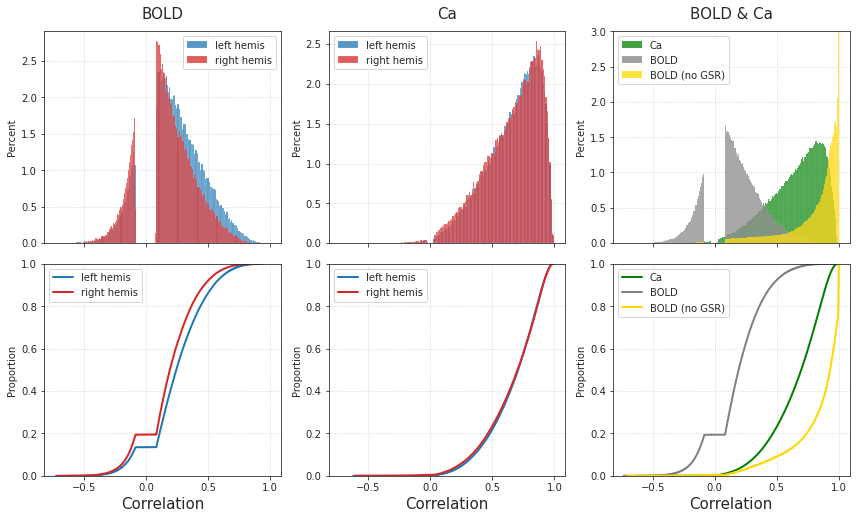

In [10]:
# HIDE CODE


fig, axes = create_figure(2, 3, (12, 7.3), sharex='all')

for i, a in enumerate([adj_bold, adj_ca]):
    xl = a[:, base.l_ids][..., base.l_ids]
    xr = a[:, base.r_ids][..., base.r_ids]
    sns.histplot(
        data=xl[xl.nonzero()],
        color='C0',
        stat='percent',
        label='left hemis',
        ax=axes[0, i],
    )
    sns.histplot(
        data=xr[xr.nonzero()],
        color='C3',
        stat='percent',
        label='right hemis',
        ax=axes[0, i],
    )
    sns.ecdfplot(
        data=xl[xl.nonzero()],
        label='left hemis',
        color='C0',
        lw=2,
        ax=axes[1, i],
    )
    sns.ecdfplot(
        data=xr[xr.nonzero()],
        label='right hemis',
        color='C3',
        lw=2,
        ax=axes[1, i],
    )

sns.histplot(
    data=adj_ca[adj_ca.nonzero()],
    color='green',
    stat='percent',
    label='Ca',
    ax=axes[0, -1],
)
sns.histplot(
    data=adj_bold[adj_bold.nonzero()],
    color='grey',
    stat='percent',
    label='BOLD',
    ax=axes[0, -1],
)
sns.histplot(
    data=adj_bold_nogsr[adj_bold_nogsr.nonzero()],
    color='gold',
    stat='percent',
    label='BOLD (no GSR)',
    ax=axes[0, -1],
)

sns.ecdfplot(
    data=adj_ca[adj_ca.nonzero()],
    label='Ca',
    color='green',
    lw=2,
    ax=axes[1, -1],
)
sns.ecdfplot(
    data=adj_bold[adj_bold.nonzero()],
    label='BOLD',
    color='grey',
    lw=2,
    ax=axes[1, -1],
)
sns.ecdfplot(
    data=adj_bold_nogsr[adj_bold_nogsr.nonzero()],
    label='BOLD (no GSR)',
    color='gold',
    lw=2,
    ax=axes[1, -1],
)
    
axes[0, 0].set_title('BOLD', fontsize=15, y=1.03)
axes[0, 1].set_title('Ca', fontsize=15, y=1.03)
axes[0, 2].set_title('BOLD & Ca', fontsize=15, y=1.03)
axes[1, 0].set_xlabel('Correlation', fontsize=15, y=1.03)
axes[1, 1].set_xlabel('Correlation', fontsize=15, y=1.03)
axes[1, 2].set_xlabel('Correlation', fontsize=15, y=1.03)
axes[0, -1].set_ylim(0, 3)

for ax in axes.flat:
    ax.legend()
    ax.grid()
    

plt.show()

**Figure description:** I have plotted histogram (first row) and Empirical CDF (second row) plots using correlation values from all runs combined. In the first 2 columns of the figure, I have used different colors to show the intra-hemisphere correlation values from left and right hemispheres.  The goal is to visualize the discrepancy in BOLD.  To be clear: I just take the intra-hemisphere sub-blocks of the covariance matrix and make separate plots using different colors for each hemisphere.  Blue is used for left hemisphere, red is used for right heisphere.  More details:

- 1st column: BOLD (left and right hemispheres separate)
- 2nd column: Ca (left and right hemispheres separate)
- 3d column: BOLD with and without GSR and Ca (left and right hemispheres not separated in this case)

**Some observations:**
1. There is a clear shift in the distribution of left and right correlation values in BOLD.  This could be due to many reasons.  I am waiting to see what Gabe finds, but this is not normal.  Could it be due to poor co-registration? Could it be due to the fact that the surgery was done on the left hemisphere?
2. Large difference in distribution of correlations in BOLD and Ca. This is not too troubling.  Appropriate thresholding the covariance matrix gets rid of this issue by achieving some sort of normalization across modalities.
3. Using GSR in BOLD has an enormous effect on the distribution of correlations.  We should do something about this.  Leaving noise in there is not good, but using GSR in its most general/simple form in not good either.

### 2) Each run separately

Now let's focus on a single run that shows significant discrepancy for BOLD.  For example here is run 5 from session 3 from animal # 2.

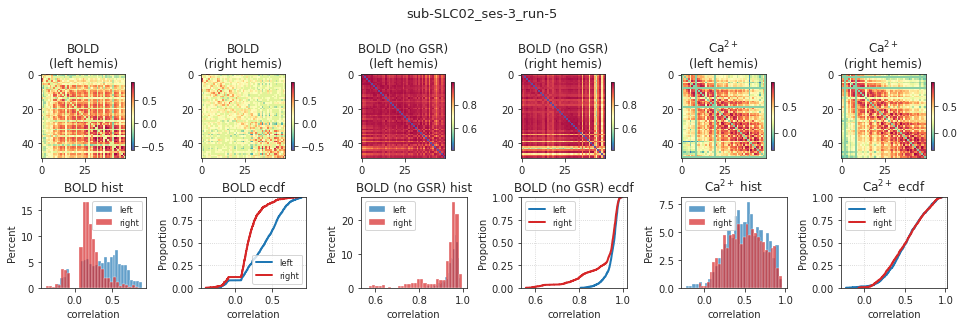

In [5]:
key = 'sub-SLC02_ses-3_run-5'
net_ca = Network(mice, key, 'ca2').load_network()
net_bold = Network(mice, key, 'bold-lite').load_network()
base = Base(mice, key=key, mode='bold-lite')
a, p = get_adj_mat(base.data, 'pearson')

adj_dict = {'BOLD': net_bold.adj, 'BOLD (no GSR)': a, r'Ca$^{2+}$': net_ca.adj}
_ = show_corrs(adj_dict, base.l_ids, base.r_ids)

**Observations:** Please see first row.  These show intra-hemisphere adjacency matrices for each hemisphere separately for each data modality.  For BOLD (1st vs. 2nd columns), we see this extreme difference between left and right intra-hemisphere correlations.  Why does it have to be this extreme?  This can't be real.  The difference is also visible in the histogram and ECDF plots in the second row.

We also see that not having GSR is not a good idea.  We should use a smarter version of GSR, looking forward to what Gabe comes up with.  Note that the left/right discrepancy is also visible in BOLD without GSR.

#### For bookkeeping purposes, I make the same plot for all runs below:

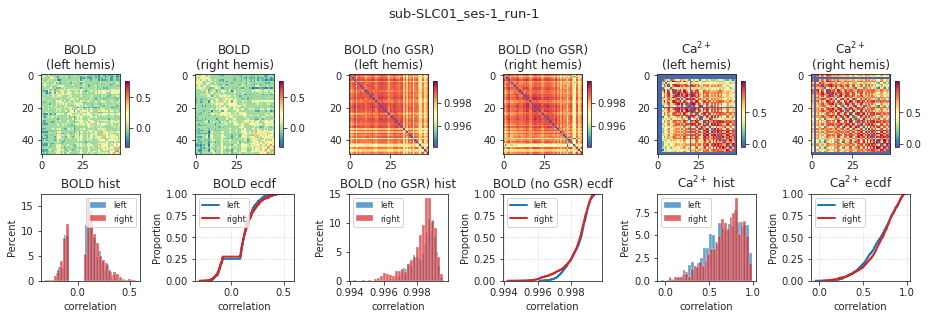

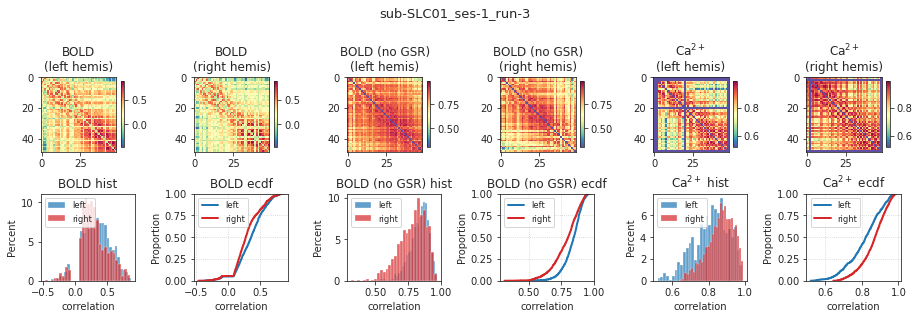

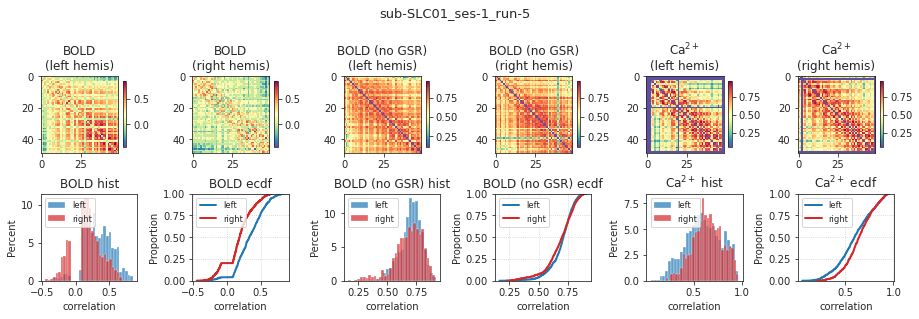

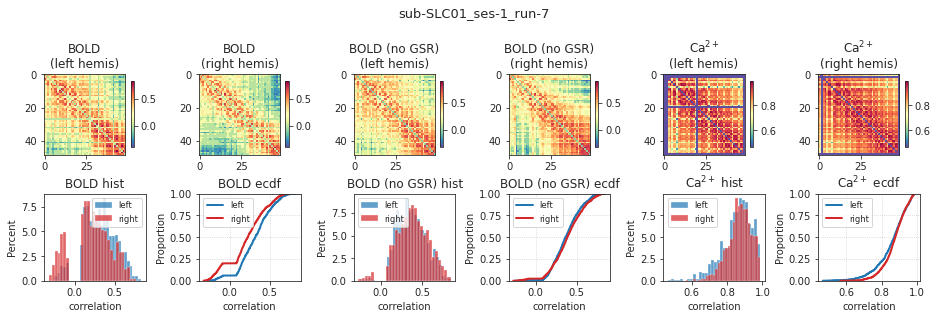

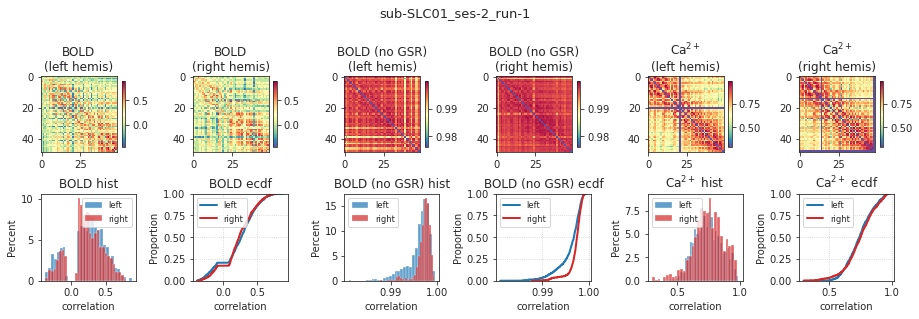

...

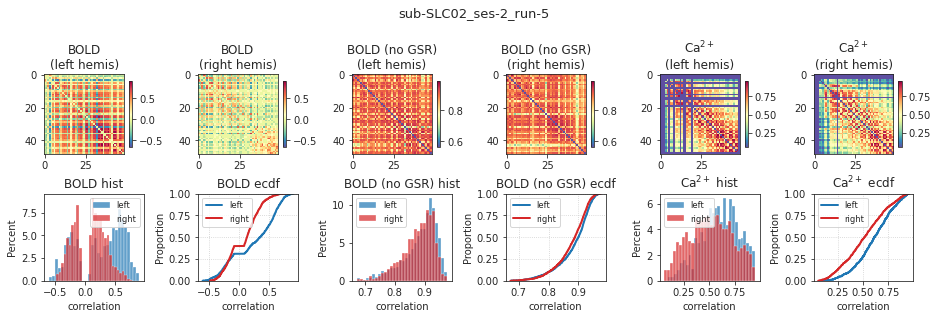

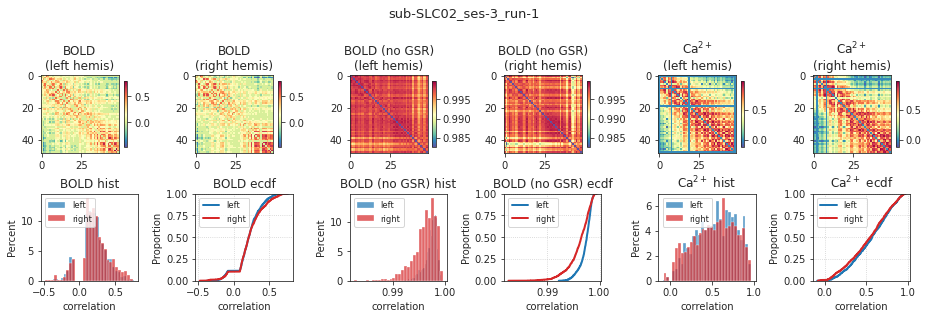

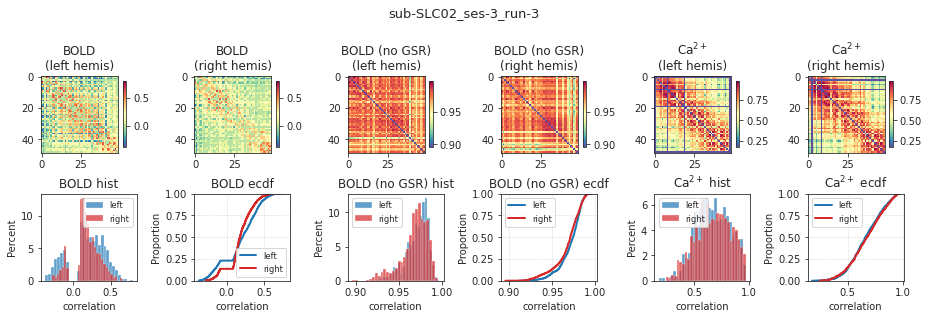

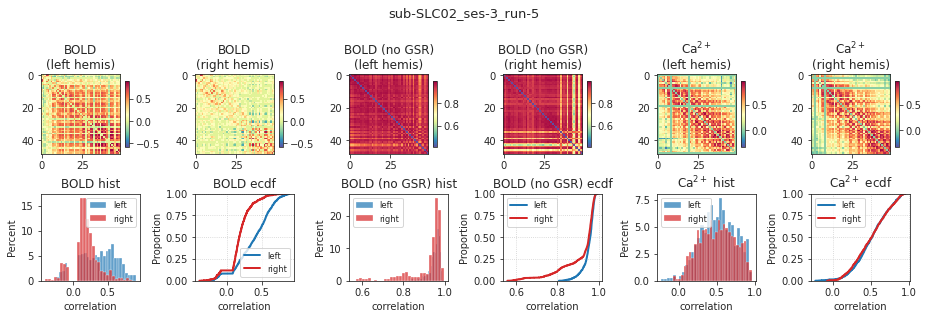

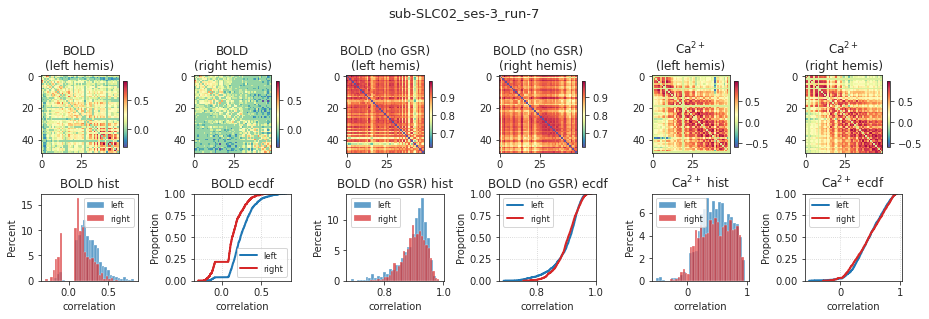

sub-SLC03_ses-1_run-1

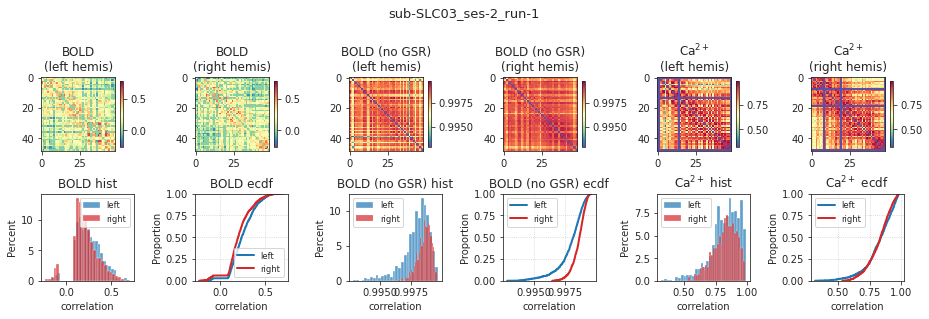

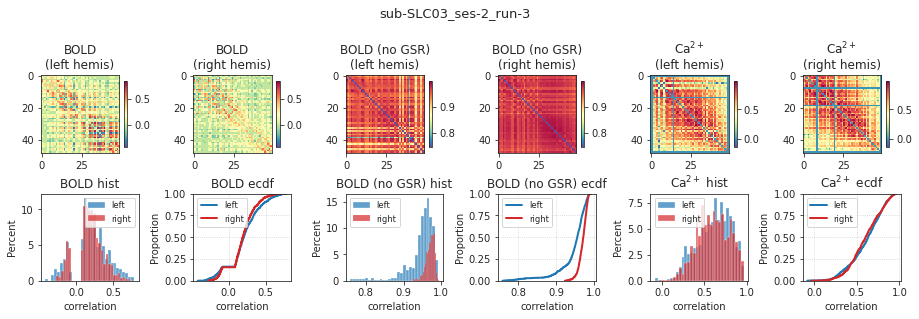

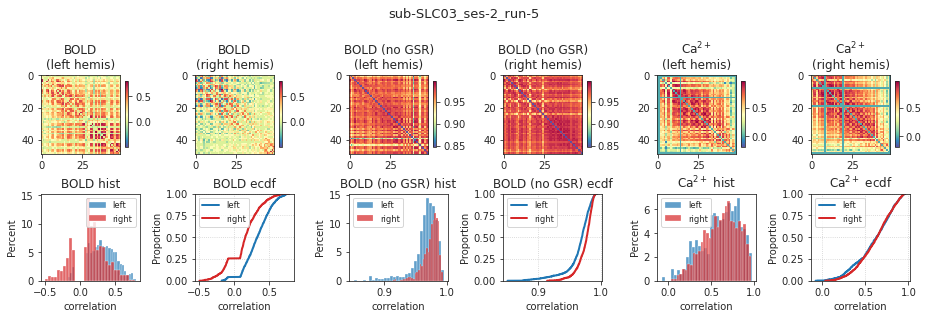

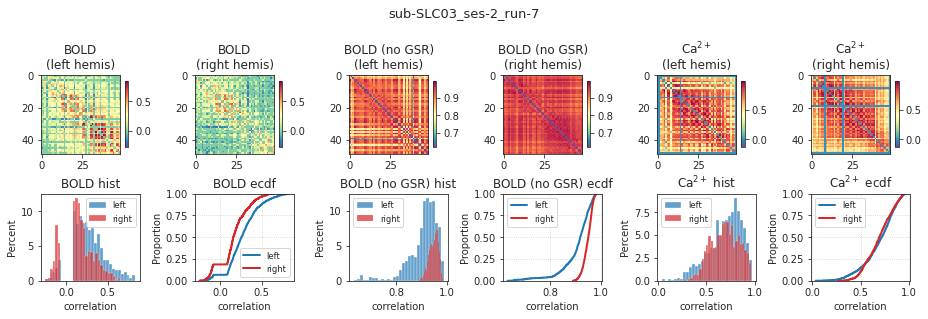

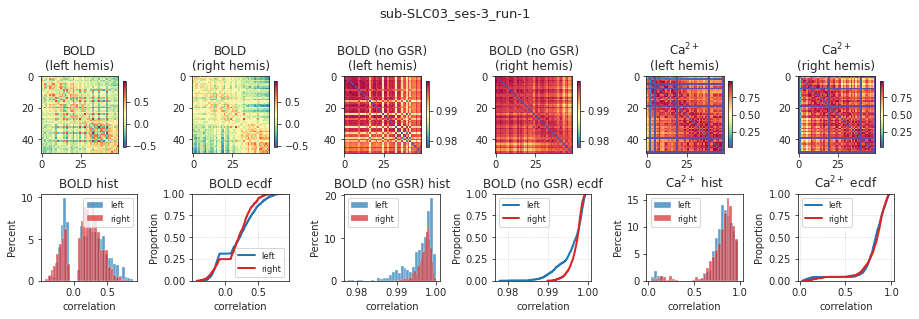

...

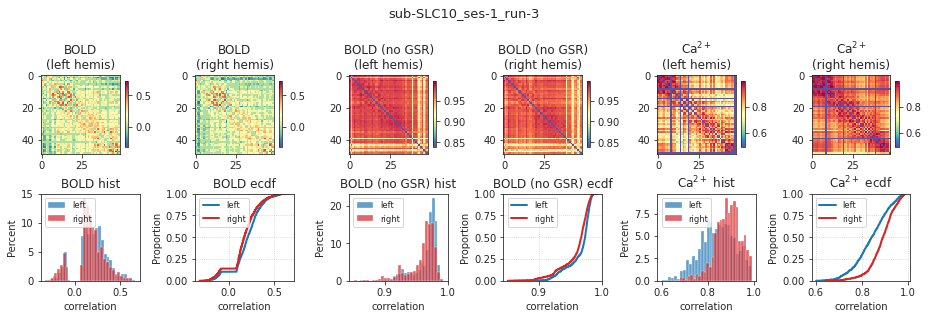

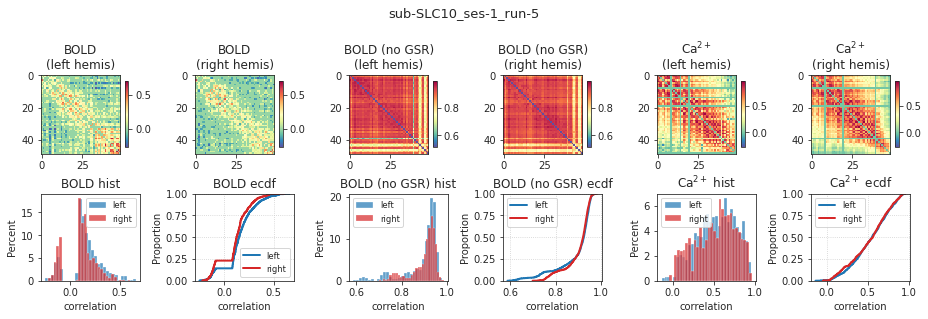

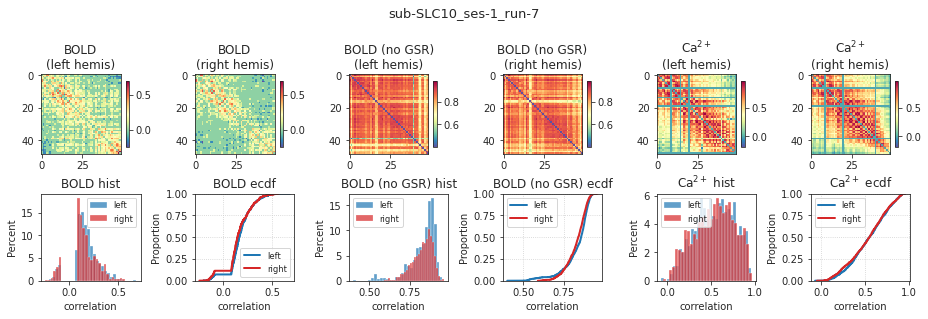

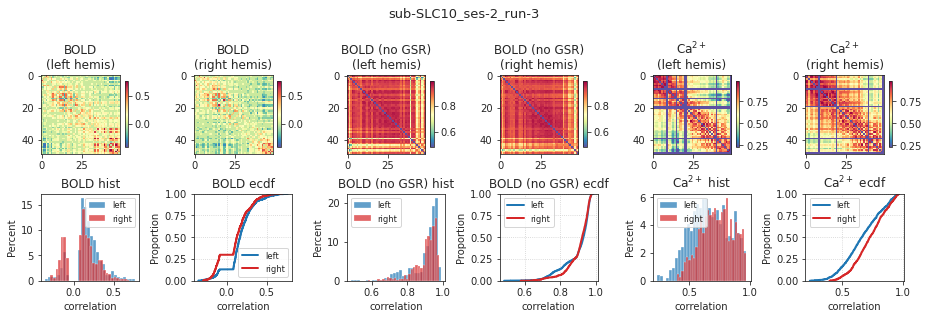

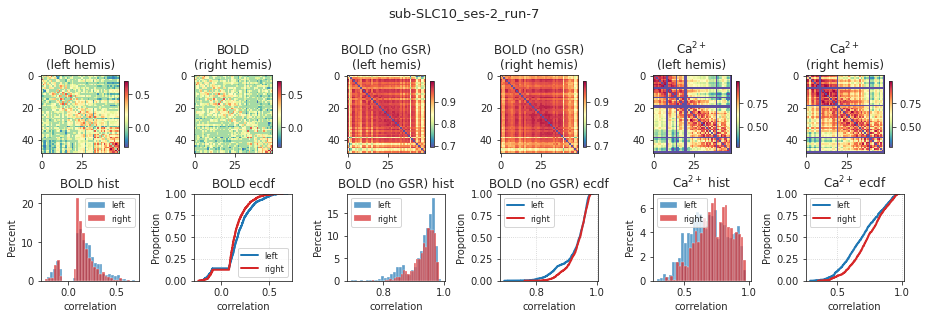

In [7]:
for key in mice.looper:
    try:
        net_ca = Network(mice, key, 'ca2').load_network()
        net_bold = Network(mice, key, 'bold-lite').load_network()
    except TypeError:
        continue
        
    if net_ca is None or net_bold is None:
        print(key)
        continue
        
    base = Base(mice, key=key, mode='bold-lite')
    a, p = get_adj_mat(base.data, 'pearson')
    
    adj_dict = {'BOLD': net_bold.adj, 'BOLD (no GSR)': a, r'Ca$^{2+}$': net_ca.adj}
    _ = show_corrs(adj_dict, base.l_ids, base.r_ids, (13., 4.3))

## Data in common space (ignore)

In [7]:
in_house = '/home/hadi/Documents/Ca-fMRI/Yale/atlases_templates'
in_house = pjoin(in_house, 'Symmetric_N162_0.20.nii.gz')
in_house = ants.image_read(in_house)
mask = in_house.get_mask().numpy()

in_house

ANTsImage (RAI)
         Pixel Type : float (float32)
         Components : 1
         Dimensions : (60, 46, 81)
         Spacing    : (0.2, 0.2, 0.2)
         Origin     : (6.4, -6.2, -7.8)
         Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

In [8]:
f = next(
    f for f in os.listdir(mice.cfg.npy_dir)
    if all(e in f for e in [key, 'N162'])
)
f

'sub-SLC02_ses-1_run-1_task-rest_space-N162_desc-gsr_bold.npy'

In [9]:
x = np.load(pjoin(mice.cfg.npy_dir, f))
x *= np.expand_dims(mask, -1)
x.shape

(60, 46, 81, 600)

<matplotlib.image.AxesImage object at 0x7f1478450c70>

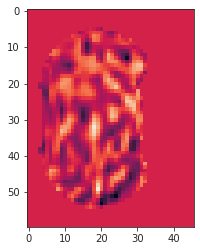

In [10]:
plt.imshow(x[..., 40, 120])

In [11]:
m_l = np.zeros_like(mask)
m_r = np.zeros_like(mask)
m_l[:30] = 1
m_r[30:] = 1

m_l *= mask
m_r *= mask

<matplotlib.image.AxesImage object at 0x7f1478425fa0>

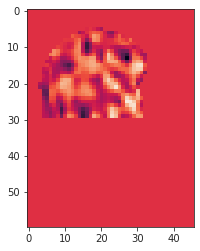

In [12]:
plt.imshow(x[..., 40, 120] * m_l[..., 40])

In [13]:
id2vox = {i + 1: vox for i, vox in enumerate(zip(*np.where(mask)))}
vox2id = {vox: idx for idx, vox in id2vox.items()}

voxels_l = [vox2id[vox] for vox in zip(*np.where(m_l))]
voxels_r = [vox2id[vox] for vox in zip(*np.where(m_r))]

len(id2vox), len(voxels_l), len(voxels_r)

(53520, 26760, 26760)

In [76]:
data = {idx: x[vox] for idx, vox in id2vox.items()}

In [91]:
df = pd.DataFrame(data)

In [92]:
df.describe()

,1,2,3,4,5,6,7,8,9,10,...,53511,53512,53513,53514,53515,53516,53517,53518,53519,53520
count,600.000000,600.000000,600.000000,600.000000,600.000000,600.000000,600.000000,600.000000,600.000000,600.000000,...,600.000000,600.000000,600.000000,600.000000,600.000000,600.000000,600.000000,600.000000,600.000000,600.000000
mean,0.000037,0.000029,0.000031,0.000024,0.000031,0.000022,0.000017,0.000028,0.000041,0.000045,...,0.000011,0.000012,0.000009,0.000013,0.000018,0.000013,0.000011,0.000012,0.000018,0.000016
std,58.042798,58.805388,63.608059,60.762439,47.452730,41.243117,35.756546,42.862502,46.623635,48.308633,...,43.970124,50.056729,44.312437,45.960689,51.093260,44.219592,35.289095,33.442775,35.815545,31.557447
min,-191.426010,-167.515213,-218.461212,-199.534576,-163.278275,-136.379990,-126.089241,-155.784683,-176.994507,-194.143387,...,-130.044159,-162.013046,-152.768066,-157.051498,-162.126602,-138.608429,-122.436371,-100.622383,-86.119919,-104.292145
25%,-36.532259,-36.199161,-37.891979,-39.854692,-29.016917,-26.259252,-22.240885,-28.871258,-31.871924,-29.183022,...,-30.408812,-36.101402,-30.158387,-30.356061,-36.120829,-30.081787,-24.755870,-21.581811,-25.588388,-20.321587
50%,-0.453899,0.383753,1.686752,3.184936,-3.439319,-1.425998,-1.707476,0.824457,1.439943,1.092670,...,0.313891,0.167545,-1.739955,-0.205414,-1.154967,-0.876468,-0.680155,0.915859,-0.450799,-0.960745
75%,37.906370,37.211691,41.442319,39.472029,30.741082,26.477701,22.287672,28.246827,33.366884,31.124300,...,32.417554,32.288509,28.775416,30.716470,33.035935,31.113621,24.254929,22.871938,25.080108,19.142567
max,199.813751,230.878967,236.490997,219.589157,180.673935,143.476425,100.445480,130.473618,120.074951,142.677170,...,129.769867,131.983063,119.165550,151.100464,153.407257,120.982765,108.582024,111.842331,120.046127,120.129410


In [106]:
%%time

a, p = get_adj_mat(df, 'pearson')

CPU times: user 38min 25s, sys: 16min 12s, total: 54min 37s
Wall time: 1h 19min 28s


In [109]:
_ = save_obj(a, f'adj_{key}', tmp_dir, 'npy')

[PROGRESS] 'adj_sub-SLC02_ses-1_run-1.npy' saved at
/home/hadi/Dropbox/git/jb-Ca-fMRI/tmp

'/home/hadi/Dropbox/git/jb-Ca-fMRI/tmp/adj_sub-SLC02_ses-1_run-1.npy'

In [14]:
a = '/home/hadi/Dropbox/git/jb-Ca-fMRI/tmp/adj_sub-SLC02_ses-1_run-1.npy'
a = pjoin(tmp_dir, a)
a = np.load(a)
a.shape

(53520, 53520)

In [15]:
l_ids = np.isin(list(id2vox), voxels_l)
r_ids = np.isin(list(id2vox), voxels_r)

<AxesSubplot:ylabel='Percent'>

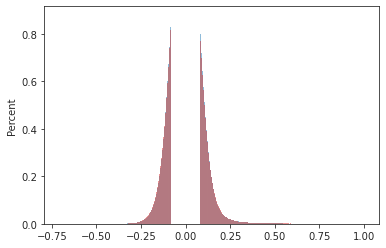

In [16]:
a_l = a[l_ids][:, l_ids]
a_r = a[r_ids][:, r_ids]

sns.histplot(a_l[a_l.nonzero()], color='C0', stat='percent', alpha=0.5)
sns.histplot(a_r[a_r.nonzero()], color='C3', stat='percent', alpha=0.5)

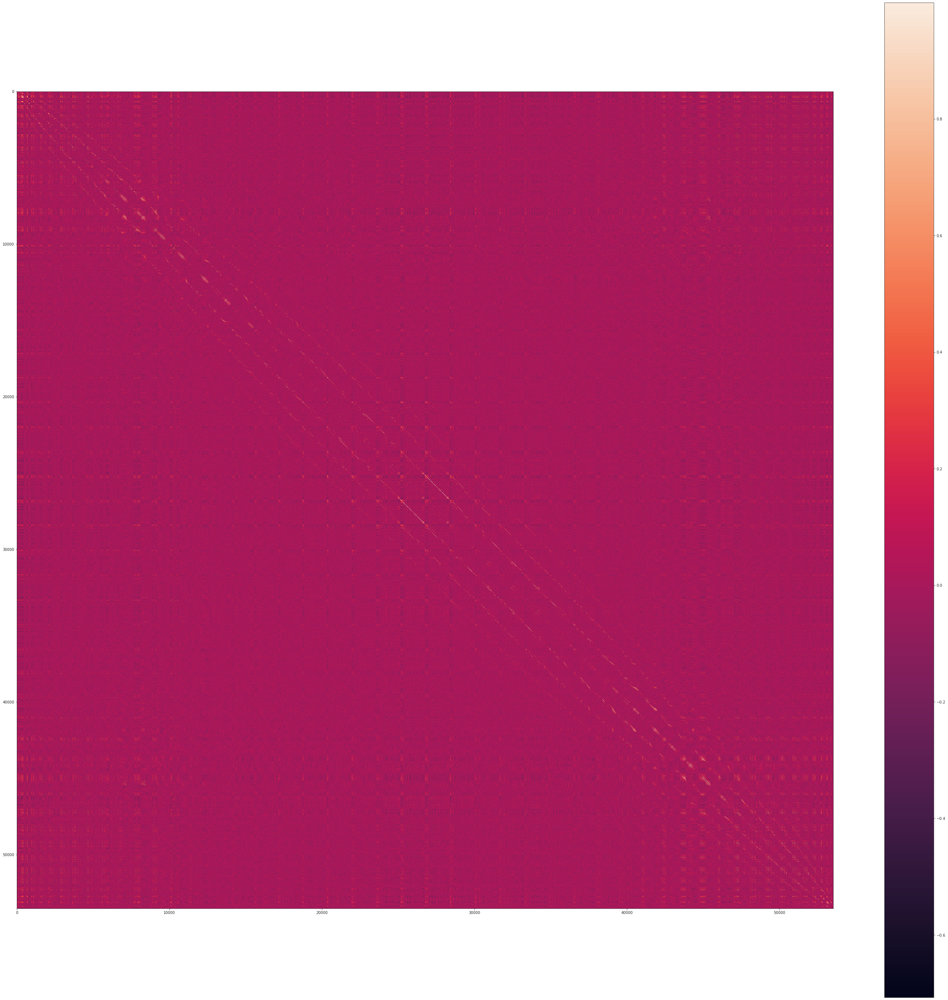

In [18]:
plt.figure(figsize=(50, 50))
plt.imshow(a)
plt.colorbar()
plt.show()